[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/{notebook_path})


# 2.5 XAI (SHAP and LIME)

### Feature Selection Method: Chi-square Test
### ML Model: Hist Gradient Boosting Classifier

In [1]:
import numpy as np
import pandas as pd
from sklearn.datasets import make_regression
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder # imports the LabelEncoder class from the scikit-learn library

def chi2_selection(X, y, num_of_feat):
    fs = SelectKBest(score_func=chi2, k=num_of_feat)
    fit = fs.fit(X, y)

    dfscores = pd.DataFrame(fit.scores_)
    dfcolumns = pd.DataFrame(X.columns)
    featureScores = pd.concat([dfcolumns, dfscores], axis=1)
    featureScores.columns = ['Best_columns', 'Score_chi2']

    lyst = featureScores.nlargest(num_of_feat, 'Score_chi2')

    chi2_features = list(lyst['Best_columns'])
    return chi2_features

# Load your dataset
df = pd.read_csv("feature_vectors_syscallsbinders_frequency_5_Cat.csv")
target = "Class"

encoder = LabelEncoder() 
df[target] = encoder.fit_transform(df[target])

X = df.loc[:, df.columns != target]
# X = X.loc[:, X.columns != "NAME"]
y = df[target]

# Iterate over different numbers of features
for i in range (47, len(X.columns), 47):
    print("Number of columns: ", i)
    chi2_list = chi2_selection(X, y, i)

    X_ = df.loc[:, chi2_list]
    y_ = df[target]

    X_train, X_test, y_train, y_test = train_test_split(X_, y_, test_size=0.2, random_state=0)

    hist = HistGradientBoostingClassifier(max_iter=116, max_depth=26, random_state=0)
    hist.fit(X_train, y_train)
    
    y_pred_test = hist.predict(X_test)
    print("Testing Accuracy: ", accuracy_score(y_test, y_pred_test))
    
    y_pred_train = hist.predict(X_train)
    print("Training Accuracy: ", accuracy_score(y_train, y_pred_train))
    print("___________________________________________________________________________________________")

Number of columns:  47
Testing Accuracy:  0.9452586206896552
Training Accuracy:  0.9987066178055616
___________________________________________________________________________________________
Number of columns:  94
Testing Accuracy:  0.9504310344827587
Training Accuracy:  0.9987066178055616
___________________________________________________________________________________________
Number of columns:  141
Testing Accuracy:  0.9461206896551724
Training Accuracy:  0.9987066178055616
___________________________________________________________________________________________
Number of columns:  188
Testing Accuracy:  0.9469827586206897
Training Accuracy:  0.9987066178055616
___________________________________________________________________________________________
Number of columns:  235
Testing Accuracy:  0.9491379310344827
Training Accuracy:  0.9987066178055616
___________________________________________________________________________________________
Number of columns:  282
Testing Accur

## Function Call

In [2]:
selected_feature_list = chi2_selection(X,y,94)
selected_feature_list

['clock_gettime',
 'ioctl',
 'sched_yield',
 'futex',
 'nanosleep',
 'read',
 'writev',
 'getpid',
 'epoll_wait',
 '__arm_nr_cacheflush',
 'getuid32',
 'access',
 '_llseek',
 'getActiveNetworkInfo',
 'fcntl64',
 'gettimeofday',
 'getDataNetworkType',
 'mprotect',
 'write',
 'pwrite64',
 'fstat64',
 'close',
 'lstat64',
 'inotify_add_watch',
 'getConnectionInfo',
 'recvfrom',
 'getDeviceId',
 'open',
 'getPackageInfo',
 'getDisplayInfo',
 'pread64',
 '_newselect',
 'stat64',
 'mmap2',
 'madvise',
 'fdatasync',
 'munmap',
 'brk',
 'FS_ACCESS(READ)____',
 'lseek',
 'FS_ACCESS____',
 'ACCESS_PERSONAL_INFO___',
 'sigprocmask',
 'getLine1Number',
 'fchown32',
 'sendto',
 'DEVICE_ACCESS_____',
 'gettid',
 'getsockopt',
 'setsockopt',
 'sigaction',
 'getPackagesForUid',
 'getpriority',
 'getdents64',
 'FS_ACCESS(CREATE)____',
 'setpriority',
 'wait4',
 'ftruncate',
 'sigaltstack',
 'FS_ACCESS(CREATE__WRITE)__',
 'getApplicationInfo',
 'getSubscriberId',
 'unlink',
 'chmod',
 'vfork',
 'socket'

In [3]:
# Selecting only the features that were identified as significant through the Univariate Feature Selection
X = df.loc[:,selected_feature_list] # Selects columns from the DataFrame df and stores them in the variable X
y = df[target] # Assigns the target variable, which is typically the variable you are trying to predict

In [4]:
X

,clock_gettime,ioctl,sched_yield,futex,nanosleep,read,writev,getpid,epoll_wait,__arm_nr_cacheflush,...,exit,TERMINATE_THREAD,EXECUTE_____,execve,notifyChange,shutdown,mkdir,sched_getparam,sched_getscheduler,getAllNetworkInfo
0,109,70,2,170,8,29,10,18,3,0,...,3,3,0,0,0,0,3,0,0,0
1,36312,544,2,5728,7,4157,46,1124,7099,1594,...,6,6,0,0,0,0,6,0,0,0
2,523,202,3,290,8,72,20,74,67,0,...,12,12,0,0,0,8,4,0,0,0
3,9865,2006,2,1175,22,489,197,1077,1710,0,...,12,12,0,0,0,0,4,0,0,0
4,373,208,3,313,9,71,25,56,46,0,...,7,7,0,0,0,0,12,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11593,29634,5493,8,3232,122,4887,236,2268,3604,3120,...,16,16,0,0,0,0,12,0,0,0
11594,233169,1995,20,11143,170,9844,295,36518,44978,38979,...,15,15,1,1,0,0,12,0,0,0
11595,1939,581,4,628,36,237,67,206,229,0,...,9,9,0,0,0,0,0,0,0,0
11596,15547,5120,13,5147,161,1645,774,1422,1718,0,...,41,41,0,0,0,0,17,0,0,0


In [5]:
from sklearn.model_selection import train_test_split # Imports the train_test_split function from scikit-learn's model_selection module.

#  Splits features (X) and target variable (y) into random train and test subsets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = 0)

X_train = X_train.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

In [6]:
X_train

,clock_gettime,ioctl,sched_yield,futex,nanosleep,read,writev,getpid,epoll_wait,__arm_nr_cacheflush,...,exit,TERMINATE_THREAD,EXECUTE_____,execve,notifyChange,shutdown,mkdir,sched_getparam,sched_getscheduler,getAllNetworkInfo
0,414,144,1,163,3,25,14,31,24,0,...,0,0,0,0,0,0,3,0,0,0
1,8494,1131,26,5287,165,2672,226,935,594,0,...,63,63,0,0,0,0,38,0,0,0
2,36671,425,5,3993,21,3896,77,4153,6731,1354,...,13,13,0,0,0,0,6,0,0,0
3,139,107,1,114,7,26,28,30,20,0,...,0,0,0,0,0,0,2,0,0,0
4,1001,455,5,1004,12,846,66,92,111,0,...,14,14,0,0,0,0,4,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9273,1019,141,0,59,2,215,7,41,476,0,...,0,0,0,0,0,0,2,0,0,0
9274,2349,439,1,250,11,647,37,188,218,0,...,3,3,0,0,0,0,2,0,0,0
9275,2788,674,15,3673,114,969,166,314,262,0,...,37,37,0,0,0,0,20,0,0,1
9276,7716,1678,14,3099,81,1041,260,740,851,0,...,46,46,0,0,0,0,28,0,0,0


# RandomForest

## Default Param

In [7]:
from sklearn.ensemble import RandomForestClassifier # Importing RandomForestClassifier from scikit-learn.
rf_default = RandomForestClassifier() # Creating an instance of RandomForestClassifier with default hyperparameters.
rf_default.fit(X_train, y_train) # Fitting the RandomForestClassifier model to the training data (X_train, y_train)
y_pred_test=rf_default.predict(X_test) # Using the trained RandomForestClassifier model (rf_default) to make predictions on the test data (X_test).


from sklearn.metrics import classification_report, confusion_matrix, accuracy_score # Importing necessary evaluation metrics from scikit-learn.

# Print confusion matrix, classification report, and accuracy
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_test))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_test))
print("\nAccuracy:", accuracy_score(y_test, y_pred_test))

Confusion Matrix:
[[223   1   1   6  12]
 [  9 380   7  14   8]
 [  0   4 766   2   2]
 [ 14   7   6 489  23]
 [  8   3   5   7 323]]

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.92      0.90       243
           1       0.96      0.91      0.93       418
           2       0.98      0.99      0.98       774
           3       0.94      0.91      0.93       539
           4       0.88      0.93      0.90       346

    accuracy                           0.94      2320
   macro avg       0.93      0.93      0.93      2320
weighted avg       0.94      0.94      0.94      2320


Accuracy: 0.9400862068965518


In [8]:
# Creating an instance of the RandomForestClassifier class
rf_all = RandomForestClassifier(n_estimators=96,max_depth=41,random_state=0) 
rf_all.fit(X_train, y_train) # trains (fits) the RandomForestClassifier model on the training data.
y_pred=rf_all.predict(X_test) # uses the trained RandomForestClassifier model (rf_all) to make predictions on the test data (X_test).
print("Accurecy: ",accuracy_score(y_test,y_pred))

Accurecy:  0.9392241379310344


In [9]:
rf_all = RandomForestClassifier(n_estimators=96,max_depth=41,random_state=0)
rf_all.fit(X_train, y_train)
y_pred=rf_all.predict(X_train) # predicts the target labels (y_pred) for the training data (X_train) using the trained rf_all model.
print("Accuracy: ",accuracy_score(y_train,y_pred))

Accuracy:  0.9987066178055616


# GradientBoosting

## Default Param

In [10]:
from sklearn.ensemble import GradientBoostingClassifier
gb_default = GradientBoostingClassifier()
gb_default.fit(X_train, y_train)
y_pred_test=gb_default.predict(X_test)


from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Print confusion matrix, classification report, and accuracy
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_test))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_test))
print("\nAccuracy:", accuracy_score(y_test, y_pred_test))

Confusion Matrix:
[[215   2   6  11   9]
 [ 10 372  12  17   7]
 [  0   8 761   3   2]
 [ 15  15  12 479  18]
 [  4   3   9  14 316]]

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.88      0.88       243
           1       0.93      0.89      0.91       418
           2       0.95      0.98      0.97       774
           3       0.91      0.89      0.90       539
           4       0.90      0.91      0.91       346

    accuracy                           0.92      2320
   macro avg       0.91      0.91      0.91      2320
weighted avg       0.92      0.92      0.92      2320


Accuracy: 0.9237068965517241


In [11]:
gb_all = GradientBoostingClassifier(n_estimators=236,max_depth=11,random_state=0)
gb_all.fit(X_train, y_train)
y_pred=gb_all.predict(X_test)
print("Accuracy: ",accuracy_score(y_test,y_pred))

KeyboardInterrupt: 

In [12]:
gb_all = GradientBoostingClassifier(n_estimators=236,max_depth=11,random_state=0)
gb_all.fit(X_train, y_train)
y_pred =gb_all.predict(X_train)
print("Accuracy: ",accuracy_score(y_train,y_pred))

Accuracy:  0.9987066178055616


# XGBoost

## Default Param

In [12]:
import xgboost as xgb
xg_default = xgb.XGBClassifier() # Create an instance of XGBoost classifier
xg_default.fit(X_train, y_train) # Train the classifier
y_pred_test = xg_default.predict(X_test) # Predict on the test data

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Print confusion matrix, classification report, and accuracy
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_test))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_test))
print("\nAccuracy:", accuracy_score(y_test, y_pred_test))

Confusion Matrix:
[[226   2   0   8   7]
 [  8 384   8  14   4]
 [  0   6 765   2   1]
 [ 14  14   9 487  15]
 [  3   1   5   6 331]]

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.93      0.91       243
           1       0.94      0.92      0.93       418
           2       0.97      0.99      0.98       774
           3       0.94      0.90      0.92       539
           4       0.92      0.96      0.94       346

    accuracy                           0.95      2320
   macro avg       0.94      0.94      0.94      2320
weighted avg       0.95      0.95      0.95      2320


Accuracy: 0.9452586206896552


In [13]:
xg_all = xgb.XGBClassifier(n_estimators=121,max_depth=21,random_state=0)
xg_all.fit(X_train, y_train)
y_pred = xg_all.predict(X_test)
print("Accuracy: ",accuracy_score(y_test,y_pred))

Accuracy:  0.9439655172413793


In [14]:
xg_all = xgb.XGBClassifier(n_estimators=121,max_depth=21,random_state=0)
xg_all.fit(X_train, y_train)
y_pred = xg_all.predict(X_train)
print("Accuracy: ",accuracy_score(y_train,y_pred))

Accuracy:  0.9987066178055616


### XGBoost Refined

In [20]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Train with default XGBoost settings
xg_default = xgb.XGBClassifier()  # Create an instance of XGBoost classifier
xg_default.fit(X_train, y_train)  # Train the classifier

# Predict on the test data
y_pred_test = xg_default.predict(X_test)

# Print confusion matrix, classification report, and accuracy
print("Confusion Matrix (Default Parameters):")
print(confusion_matrix(y_test, y_pred_test))

print("\nClassification Report (Default Parameters):")
print(classification_report(y_test, y_pred_test))

print("\nTest Accuracy (Default Parameters):", accuracy_score(y_test, y_pred_test))

# Train with custom parameters
xg_all = xgb.XGBClassifier(n_estimators=121, max_depth=21, random_state=0)
xg_all.fit(X_train, y_train)

# Predict on the test set
y_pred_test_custom = xg_all.predict(X_test)
print("\nTest Accuracy (Custom Parameters):", accuracy_score(y_test, y_pred_test_custom))

# Predict on the training set (to check for overfitting)
y_pred_train_custom = xg_all.predict(X_train)
print("Training Accuracy (Custom Parameters):", accuracy_score(y_train, y_pred_train_custom))


Confusion Matrix (Default Parameters):
[[239   5   0  13   5]
 [ 12 382   8  13   9]
 [  2   4 778   1   1]
 [  9   7   2 467  15]
 [  8   1   9   9 321]]

Classification Report (Default Parameters):
              precision    recall  f1-score   support

           0       0.89      0.91      0.90       262
           1       0.96      0.90      0.93       424
           2       0.98      0.99      0.98       786
           3       0.93      0.93      0.93       500
           4       0.91      0.92      0.92       348

    accuracy                           0.94      2320
   macro avg       0.93      0.93      0.93      2320
weighted avg       0.94      0.94      0.94      2320


Test Accuracy (Default Parameters): 0.9426724137931034

Test Accuracy (Custom Parameters): 0.9435344827586207
Training Accuracy (Custom Parameters): 0.9982754904074154


### XGBoost with cross validation

In [19]:
import xgboost as xgb
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Default XGBoost Classifier
xg_default = xgb.XGBClassifier()
xg_default.fit(X_train, y_train)
y_pred_test_default = xg_default.predict(X_test)

# Performance metrics for default XGBoost
print("Default XGBoost Classifier:")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_test_default))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_test_default))
print("\nAccuracy:", accuracy_score(y_test, y_pred_test_default))

# XGBoost with custom parameters
xg_all = xgb.XGBClassifier(n_estimators=121, max_depth=21, random_state=0)
xg_all.fit(X_train, y_train)
y_pred_test_all = xg_all.predict(X_test)

# Performance metrics for custom XGBoost
print("\nCustom XGBoost Classifier:")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_test_all))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_test_all))
print("\nAccuracy:", accuracy_score(y_test, y_pred_test_all))

# Optional: Cross-validation for better evaluation
cv_scores_default = cross_val_score(xg_default, X_train, y_train, cv=5)
cv_scores_all = cross_val_score(xg_all, X_train, y_train, cv=5)

print("\nCross-Validation Accuracy (Default):", cv_scores_default.mean())
print("Cross-Validation Accuracy (Custom):", cv_scores_all.mean())

Default XGBoost Classifier:
Confusion Matrix:
[[239   5   0  13   5]
 [ 12 382   8  13   9]
 [  2   4 778   1   1]
 [  9   7   2 467  15]
 [  8   1   9   9 321]]

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.91      0.90       262
           1       0.96      0.90      0.93       424
           2       0.98      0.99      0.98       786
           3       0.93      0.93      0.93       500
           4       0.91      0.92      0.92       348

    accuracy                           0.94      2320
   macro avg       0.93      0.93      0.93      2320
weighted avg       0.94      0.94      0.94      2320


Accuracy: 0.9426724137931034

Custom XGBoost Classifier:
Confusion Matrix:
[[241   5   0  12   4]
 [ 13 381   9  13   8]
 [  1   4 779   1   1]
 [  9   8   3 467  13]
 [  9   2   8   8 321]]

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.92      0.90       262


# boost-histogram

## Default Param

In [7]:
from sklearn.ensemble import HistGradientBoostingClassifier
hg_default = HistGradientBoostingClassifier()
hg_default.fit(X_train, y_train)
y_pred_test = hg_default.predict(X_test)

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_test))
print("\nClassification Report:")
print(classification_report(y_test, y_pred_test))
print("\nAccuracy:", accuracy_score(y_test, y_pred_test))

Confusion Matrix:
[[228   3   0   6   6]
 [  9 385   6  12   6]
 [  0   4 767   1   2]
 [ 17  14   5 489  14]
 [  4   4   2   5 331]]

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.94      0.91       243
           1       0.94      0.92      0.93       418
           2       0.98      0.99      0.99       774
           3       0.95      0.91      0.93       539
           4       0.92      0.96      0.94       346

    accuracy                           0.95      2320
   macro avg       0.94      0.94      0.94      2320
weighted avg       0.95      0.95      0.95      2320


Accuracy: 0.9482758620689655


In [8]:
hg_all = HistGradientBoostingClassifier(max_iter=116,max_depth=26,random_state=0)
hg_all.fit(X_train, y_train)
y_pred = hg_all.predict(X_test)
print("Accuracy: ",accuracy_score(y_test,y_pred))

Accuracy:  0.9504310344827587


In [9]:
hg_all = HistGradientBoostingClassifier(max_iter=116,max_depth=26,random_state=0)
hg_all.fit(X_train, y_train)
y_pred = hg_all.predict(X_train)
print("Accuracy: ",accuracy_score(y_train,y_pred))

Accuracy:  0.9987066178055616


### Hist Gradient Boosting Refactored

In [10]:
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Train with default HistGradientBoostingClassifier
hg_default = HistGradientBoostingClassifier()
hg_default.fit(X_train, y_train)

# Predict on the test data
y_pred_test_default = hg_default.predict(X_test)

# Print confusion matrix, classification report, and accuracy
print("Confusion Matrix (Default Parameters):")
print(confusion_matrix(y_test, y_pred_test_default))

print("\nClassification Report (Default Parameters):")
print(classification_report(y_test, y_pred_test_default))

print("\nTest Accuracy (Default Parameters):", accuracy_score(y_test, y_pred_test_default))

# Train with custom parameters
hg_all = HistGradientBoostingClassifier(max_iter=116, max_depth=26, random_state=0)
hg_all.fit(X_train, y_train)

# Predict on the test set
y_pred_test_custom = hg_all.predict(X_test)
print("\nTest Accuracy (Custom Parameters):", accuracy_score(y_test, y_pred_test_custom))

# Predict on the training set (to check for overfitting)
#y_pred_train_custom = hg_all.predict(X_train)
#print("Training Accuracy (Custom Parameters):", accuracy_score(y_train, y_pred_train_custom))


Confusion Matrix (Default Parameters):
[[228   3   0   6   6]
 [  9 385   6  12   6]
 [  0   4 767   1   2]
 [ 17  14   5 489  14]
 [  4   4   2   5 331]]

Classification Report (Default Parameters):
              precision    recall  f1-score   support

           0       0.88      0.94      0.91       243
           1       0.94      0.92      0.93       418
           2       0.98      0.99      0.99       774
           3       0.95      0.91      0.93       539
           4       0.92      0.96      0.94       346

    accuracy                           0.95      2320
   macro avg       0.94      0.94      0.94      2320
weighted avg       0.95      0.95      0.95      2320


Test Accuracy (Default Parameters): 0.9482758620689655

Test Accuracy (Custom Parameters): 0.9504310344827587


## Stacked models

In [22]:
import xgboost as xgb
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import numpy as np
from sklearn.model_selection import train_test_split

# Train XGBoost with custom parameters
xg_custom = xgb.XGBClassifier(n_estimators=121, max_depth=21, random_state=0)
xg_custom.fit(X_train, y_train)

# Train Hist Gradient Boosting with custom parameters
hg_custom = HistGradientBoostingClassifier(max_iter=116, max_depth=26, random_state=0)
hg_custom.fit(X_train, y_train)

# Get predictions for the test set from both models
xg_pred_test = xg_custom.predict(X_test)
hg_pred_test = hg_custom.predict(X_test)

# Stack the predictions as new features for the meta-model
stacked_predictions = np.column_stack((xg_pred_test, hg_pred_test))

# Train a meta-model (Logistic Regression in this case) on the stacked predictions
meta_model = LogisticRegression(random_state=0)
meta_model.fit(stacked_predictions, y_test)

# Make final predictions using the meta-model
final_predictions = meta_model.predict(stacked_predictions)

# Evaluate the accuracy of the stacked model
print("Stacked Model Test Accuracy:", accuracy_score(y_test, final_predictions))

# Optionally, get predictions on the training set to check for overfitting
xg_pred_train = xg_custom.predict(X_train)
hg_pred_train = hg_custom.predict(X_train)

stacked_predictions_train = np.column_stack((xg_pred_train, hg_pred_train))
final_predictions_train = meta_model.predict(stacked_predictions_train)

print("Stacked Model Training Accuracy:", accuracy_score(y_train, final_predictions_train))


Stacked Model Test Accuracy: 0.9413793103448276
Stacked Model Training Accuracy: 0.9982754904074154


# XAi: LIME

In [1]:
!pip install lime

  Using cached lime-0.2.0.1-py3-none-any.whl
  Using cached lazy_loader-0.4-py3-none-any.whl.metadata (7.6 kB)
   ---------------------------------------- 0.0/12.9 MB ? eta -:--:--
    --------------------------------------- 0.3/12.9 MB ? eta -:--:--
   - -------------------------------------- 0.5/12.9 MB 799.2 kB/s eta 0:00:16
   -- ------------------------------------- 0.8/12.9 MB 1.1 MB/s eta 0:00:11
   --- ------------------------------------ 1.0/12.9 MB 1.2 MB/s eta 0:00:10
   ---- ----------------------------------- 1.3/12.9 MB 1.2 MB/s eta 0:00:11
   ---- ----------------------------------- 1.6/12.9 MB 1.1 MB/s eta 0:00:10
   ----- ---------------------------------- 1.8/12.9 MB 1.1 MB/s eta 0:00:10
   ------ --------------------------------- 2.1/12.9 MB 1.1 MB/s eta 0:00:10
   ------ --------------------------------- 2.1/12.9 MB 1.1 MB/s eta 0:00:10
   ------- -------------------------------- 2.4/12.9 MB 1.1 MB/s eta 0:00:10
   -------- ------------------------------- 2.6/12.9 M

In [11]:
## LIME for HGC

import numpy as np
import lime
from lime import lime_tabular

def LIME_EXP(row, model, class_idx):
    explainer = lime_tabular.LimeTabularExplainer(
        training_data=np.array(X_train),
        feature_names=selected_feature_list,
        class_names=["Adware", "Banking", "SMS", "Riskware", "Benign"],  # Adjust class order
        mode='classification'
    )

    # Specify the class index (e.g., class_idx=2 for "SMS")
    explanation = explainer.explain_instance(
        np.array(X_test.iloc[row]),
        model.predict_proba,
        num_features=10,
        labels=[class_idx]  # Focus explanation on the class of interest
    )

    explanation.show_in_notebook()
    return explanation

row = 112
class_idx = 2  # Index for "SMS" class
LIME_EXP(row, hg_all, class_idx).save_to_file("hist_all_sms_"+str(row)+".html")


# Print actual and predicted values for the selected row
print("Actual value of row", row, ":", y_test[row])
print("Prediction of row", row, ":", hg_all.predict(ex_specie)[0])

c:\Users\nadip\anaconda3\envs\Computer_Security\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but HistGradientBoostingClassifier was fitted with feature names
  warnings.warn(


Actual value of row 112 : 1


NameError: name 'ex_specie' is not defined

## Function

In [12]:
import lime
from lime import lime_tabular

def LIME_EXP(row,model):

  explainer = lime_tabular.LimeTabularExplainer(
      training_data=np.array(X_train),
      feature_names=selected_feature_list,
      class_names=["Adware", "Banking", "SMS", "Riskware", "Benign"]
  )


  explanation = explainer.explain_instance(X_test.iloc[row],
                              model.predict_proba,num_features=10)

  # Print feature contributions
  explanation.show_in_notebook()
  return explanation

## Test

In [1]:
'''
import lime
from lime import lime_tabular
import numpy as np

def LIME_EXP(row, model, X_train, X_test, selected_feature_list):
    explainer = lime_tabular.LimeTabularExplainer(
        training_data=np.array(X_train),
        feature_names=selected_feature_list,
        class_names=["Benign", "Malware"]
    )
    
    explanation = explainer.explain_instance(
        X_test.iloc[row],
        model.predict_proba,
        num_features=250
    )
    
    # Print feature contributions
    explanation.show_in_notebook()
    return explanation

# Assuming X_train, X_test, y_test, hg_all (model), and selected_feature_list are already defined

row = 2
ex_specie = np.array(X_test.iloc[row]).reshape(1, -1)
print("Actual value of row ", row, " : ", y_test[row])
print("Prediction of row ", row, " : ", hg_all.predict(ex_specie)[0])

explanation = LIME_EXP(row, hg_all, X_train, X_test, selected_feature_list)
explanation.save_to_file("hist_all_" + str(row) + ".html")
'''

'\nimport lime\nfrom lime import lime_tabular\nimport numpy as np\n\ndef LIME_EXP(row, model, X_train, X_test, selected_feature_list):\n    explainer = lime_tabular.LimeTabularExplainer(\n        training_data=np.array(X_train),\n        feature_names=selected_feature_list,\n        class_names=["Benign", "Malware"]\n    )\n    \n    explanation = explainer.explain_instance(\n        X_test.iloc[row],\n        model.predict_proba,\n        num_features=250\n    )\n    \n    # Print feature contributions\n    explanation.show_in_notebook()\n    return explanation\n\n# Assuming X_train, X_test, y_test, hg_all (model), and selected_feature_list are already defined\n\nrow = 2\nex_specie = np.array(X_test.iloc[row]).reshape(1, -1)\nprint("Actual value of row ", row, " : ", y_test[row])\nprint("Prediction of row ", row, " : ", hg_all.predict(ex_specie)[0])\n\nexplanation = LIME_EXP(row, hg_all, X_train, X_test, selected_feature_list)\nexplanation.save_to_file("hist_all_" + str(row) + ".html"

## Index of Row to explain

In [13]:
# list(y_test)[6]
y_test

0       2
1       3
2       2
3       2
4       2
       ..
2315    3
2316    1
2317    1
2318    3
2319    0
Name: Class, Length: 2320, dtype: int64

In [14]:
row = 2315
ex_specie = np.array(X_test.iloc[row]).reshape(1,-1)

# Hist LIME

In [15]:
print("Actual value of row ",row," : ",y_test[row])
print("Prediction of row ",row," : ",hg_all.predict(ex_specie)[0])

Actual value of row  2315  :  3
Prediction of row  2315  :  3


c:\Users\nadip\anaconda3\envs\Computer_Security\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but HistGradientBoostingClassifier was fitted with feature names
  warnings.warn(


In [16]:
LIME_EXP(row,hg_all).save_to_file("hist_all_"+str(row)+".html")

c:\Users\nadip\anaconda3\envs\Computer_Security\Lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\nadip\anaconda3\envs\Computer_Security\Lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\nadip\anaconda3\envs\Computer_Security\Lib\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels 

# RF LIME

In [48]:
print("Actual value of row ",row," : ",y_test[row])
print("Prediction of row ",row," : ",rf_all.predict(ex_specie)[0])

Actual value of row  3  :  0
Prediction of row  3  :  0


c:\Users\nadip\anaconda3\envs\Test_Environment\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [49]:
LIME_EXP(row,rf_all).save_to_file("rf_all_"+str(row)+".html")

c:\Users\nadip\anaconda3\envs\Test_Environment\Lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\nadip\anaconda3\envs\Test_Environment\Lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\nadip\anaconda3\envs\Test_Environment\Lib\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (co

# GB LIME

In [50]:
print("Actual value of row ",row," : ",y_test[row])
print("Prediction of row ",row," : ",gb_all.predict(ex_specie)[0])

Actual value of row  3  :  0
Prediction of row  3  :  0


c:\Users\nadip\anaconda3\envs\Test_Environment\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(


In [51]:
LIME_EXP(row,gb_all).save_to_file("gb_all_"+str(row)+".html")

c:\Users\nadip\anaconda3\envs\Test_Environment\Lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\nadip\anaconda3\envs\Test_Environment\Lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\nadip\anaconda3\envs\Test_Environment\Lib\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (co

# XG LIME

In [52]:
print("Actual value of row ",row," : ",y_test[row])
print("Prediction of row ",row," : ",xg_all.predict(ex_specie)[0])

Actual value of row  3  :  0
Prediction of row  3  :  0


In [53]:
LIME_EXP(row,xg_all).save_to_file("xg_all_"+str(row)+".html")

c:\Users\nadip\anaconda3\envs\Test_Environment\Lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\nadip\anaconda3\envs\Test_Environment\Lib\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
c:\Users\nadip\anaconda3\envs\Test_Environment\Lib\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (co

# SHAP

In [21]:
# pip install shap


  Using cached cloudpickle-3.0.0-py3-none-any.whl.metadata (7.0 kB)
Using cached cloudpickle-3.0.0-py3-none-any.whl (20 kB)
   ---------------------------------------- 0.0/2.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/2.7 MB ? eta -:--:--
   --- ------------------------------------ 0.3/2.7 MB ? eta -:--:--
   ----------- ---------------------------- 0.8/2.7 MB 1.3 MB/s eta 0:00:02
   ----------- ---------------------------- 0.8/2.7 MB 1.3 MB/s eta 0:00:02
   ------------------- -------------------- 1.3/2.7 MB 1.3 MB/s eta 0:00:02
   ------------------- -------------------- 1.3/2.7 MB 1.3 MB/s eta 0:00:02
   ----------------------- ---------------- 1.6/2.7 MB 1.2 MB/s eta 0:00:01
   --------------------------- ------------ 1.8/2.7 MB 1.1 MB/s eta 0:00:01
   ------------------------------ --------- 2.1/2.7 MB 1.2 MB/s eta 0:00:01
   ---------------------------------- ----- 2.4/2.7 MB 1.2 MB/s eta 0:00:01
   ---------------------------------------- 2.7/2.7 MB 1.2 M

  You can safely remove it manually.
  You can safely remove it manually.


In [28]:
pip uninstall numpy

^C
Note: you may need to restart the kernel to use updated packages.


In [17]:
import shap
import matplotlib.pyplot as plt


def SHAP_EXP(model):
  print("Models: ",model)

  explainer = shap.Explainer(model.predict, X_test)

  shap_values1 = explainer (X_test)
  ind = 2
  features_names = selected_feature_list

  if 'Subjects' in features_names:
    features_names.pop(0)

  print("Global Explaination")
  shap.plots.bar(shap_values1,max_display=30,show=False)
  plt.show()

  print("Global Explaination")
  shap.summary_plot(shap_values1,max_display=30,show=False)
  plt.show()

  print("__________________________")
  shap.plots.violin(shap_values1,max_display=30,show=False)
  plt.show()

  print("Local Explaination")
  shap.plots.violin(shap_values1,feature_names=features_names, max_display=30,show=False)
  plt.show()

  print("___________________________")
  print("Local Explaination")
  shap.plots.waterfall(shap_values1[ind],max_display=30,show=False)
  plt.show()

  print("Local Explaination")
  shap.plots.bar(shap_values1[ind],max_display=30,show=False)
  plt.show()

c:\Users\nadip\anaconda3\envs\Computer_Security\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [20]:
import shap
import matplotlib.pyplot as plt

def SHAP_EXP(model):
    print("Model:", model)

    # Create SHAP explainer using the model and test data
    explainer = shap.Explainer(model.predict, X_test)
    shap_values = explainer(X_test)
    
    # Global explanation - Bar plot
    print("Global Explanation (Bar Plot)")
    shap.plots.bar(shap_values, max_display=30)
    plt.show()
    print("__________________________________________________________________________________")

    # Global explanation - Violin plot
    print("Global Explanation (Violin Plot)")
    shap.plots.violin(shap_values, max_display=30)
    plt.show()
    print("__________________________________________________________________________________")

    # Global explanation - Force plot
    print("Global Explanation (Force Plot)")
    shap.force_plot(explainer.expected_value, shap_values.values, X_test, show=False, matplotlib=True)
    plt.show()
    print("__________________________________________________________________________________")

    # Global explanation - Summary plot (dot or beeswarm plot)
    print("Global Explanation (Summary Plot)")
    shap.summary_plot(shap_values, X_test, max_display=30)
    plt.show()
    print("__________________________________________________________________________________")

    # Global explanation - Heatmap (for multi-output models or multi-class classification)
    if len(shap_values.shape) > 2:
        print("Global Explanation (Heatmap)")
        shap.plots.heatmap(shap_values)
        plt.show()
        print("__________________________________________________________________________________")

    # Global explanation - Decision plot
    print("Global Explanation (Decision Plot)")
    shap.decision_plot(explainer.expected_value, shap_values.values, X_test)
    plt.show()
    print("__________________________________________________________________________________")

    # Local explanations for a specific instance (e.g., index 2)
    ind = 2

    # Local explanation - Waterfall plot
    print(f"Local Explanation (Waterfall Plot for instance {ind})")
    shap.plots.waterfall(shap_values[ind], max_display=20)
    plt.show()
    print("__________________________________________________________________________________")

    # Local explanation - Bar plot
    print(f"Local Explanation (Bar Plot for instance {ind})")
    shap.plots.bar(shap_values[ind], max_display=20)
    plt.show()
    print("__________________________________________________________________________________")

    # Local explanation - Force plot
    print(f"Local Explanation (Force Plot for instance {ind})")
    shap.force_plot(explainer.expected_value[ind], shap_values.values[ind], X_test.iloc[ind], show=False, matplotlib=True)
    plt.show()
    print("__________________________________________________________________________________")

    # Local explanation - Dependence plot
    print(f"Local Explanation (Dependence Plot for feature {selected_feature_list[0]})")
    shap.dependence_plot(selected_feature_list[0], shap_values.values, X_test)
    plt.show()
    print("__________________________________________________________________________________")

Model: HistGradientBoostingClassifier(max_depth=26, max_iter=116, random_state=0)


PermutationExplainer explainer: 2321it [1:19:26,  2.06s/it]                          


Global Explanation (Bar Plot)


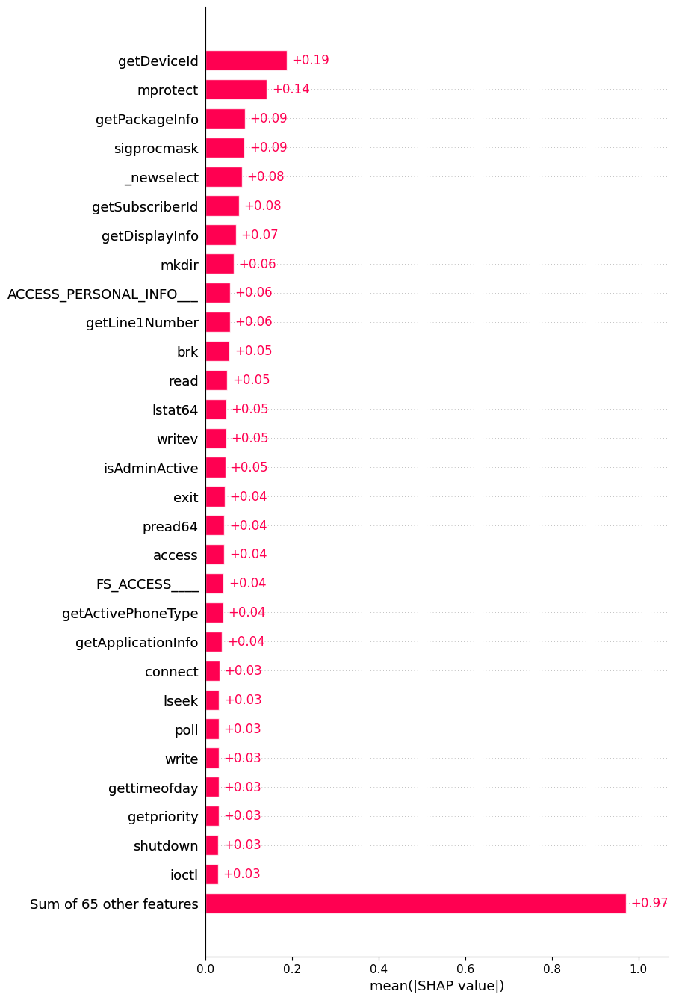

__________________________________________________________________________________
Global Explanation (Violin Plot)


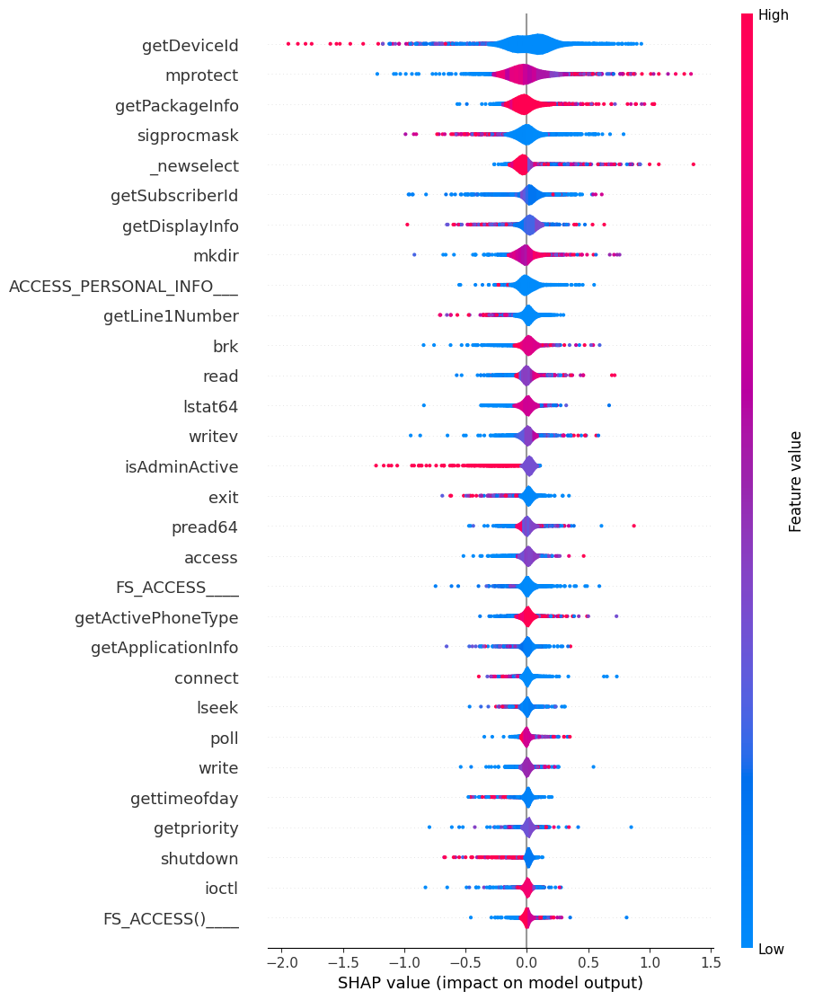

__________________________________________________________________________________
Global Explanation (Force Plot)


AttributeError: 'PermutationExplainer' object has no attribute 'expected_value'

In [21]:
SHAP_EXP(hg_all)

Models:  RandomForestClassifier(max_depth=26, n_estimators=11, random_state=0)


PermutationExplainer explainer: 235it [00:17,  7.46it/s]                         


Global Explaination


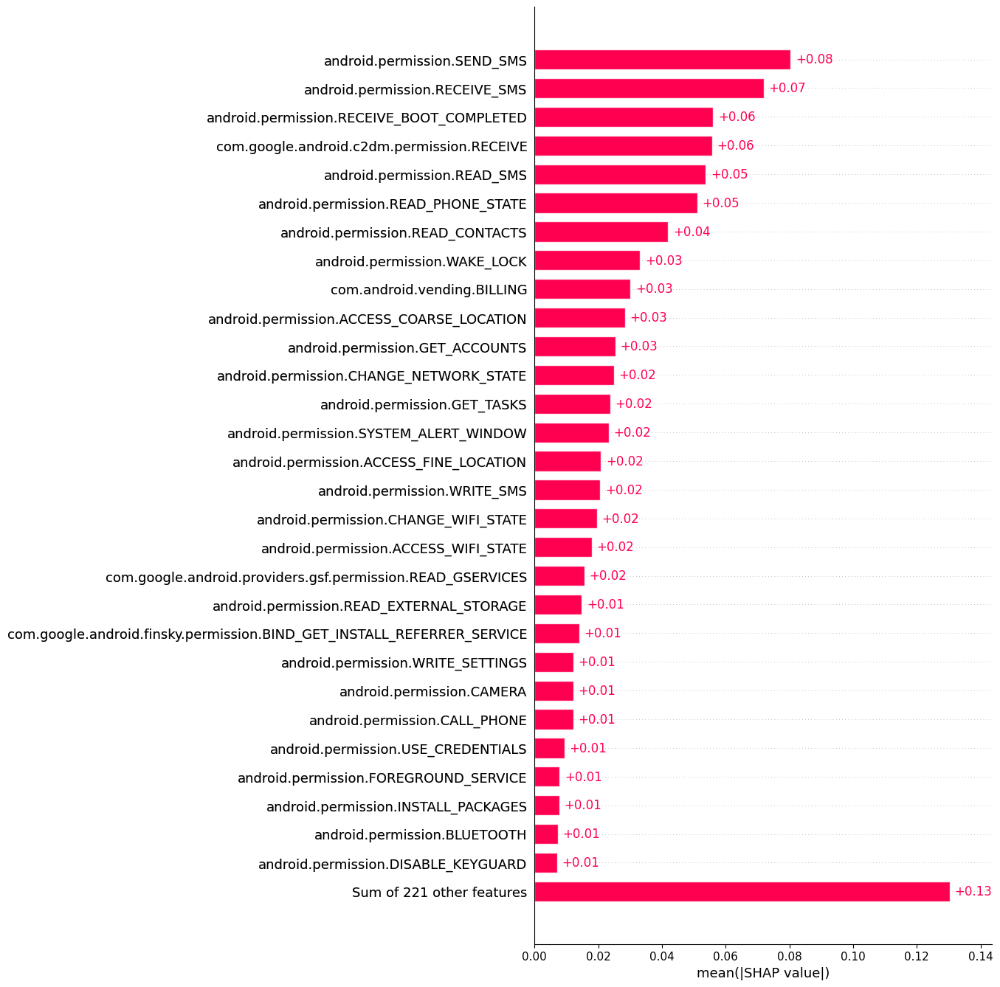

Global Explaination


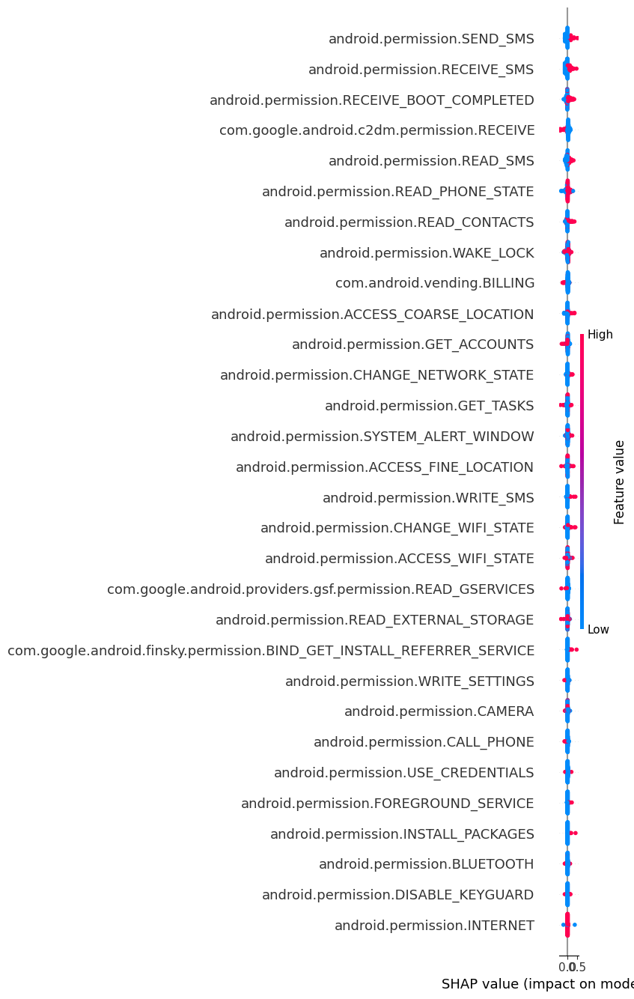

__________________________


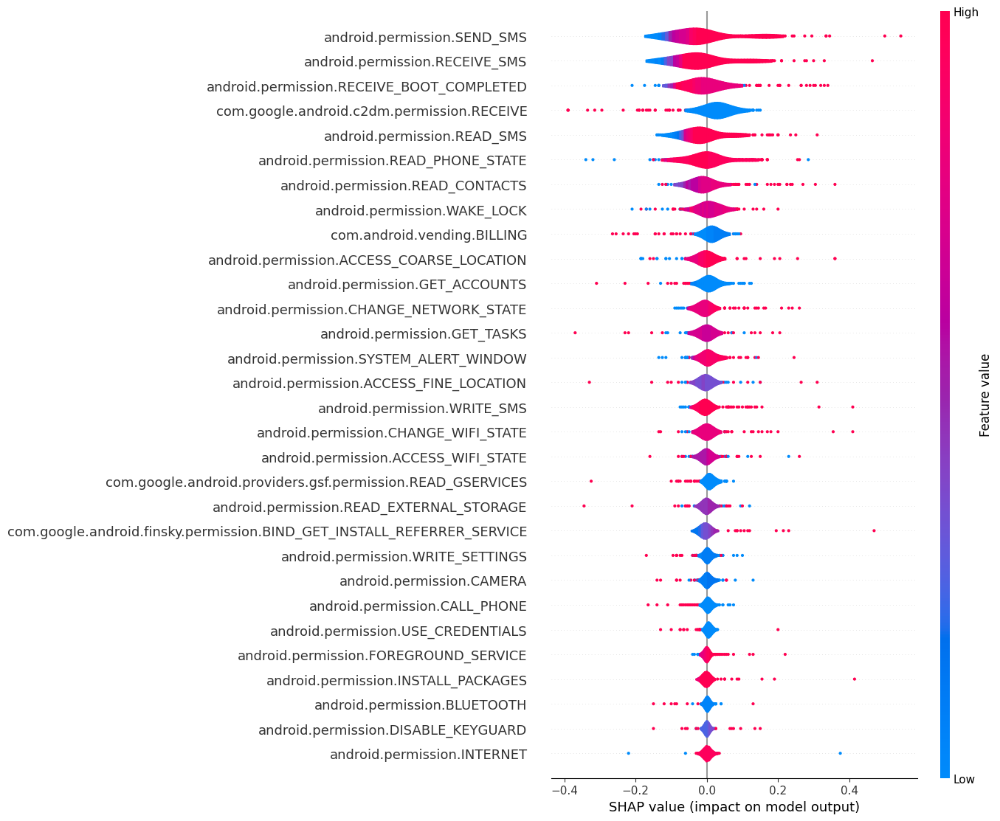

Local Explaination


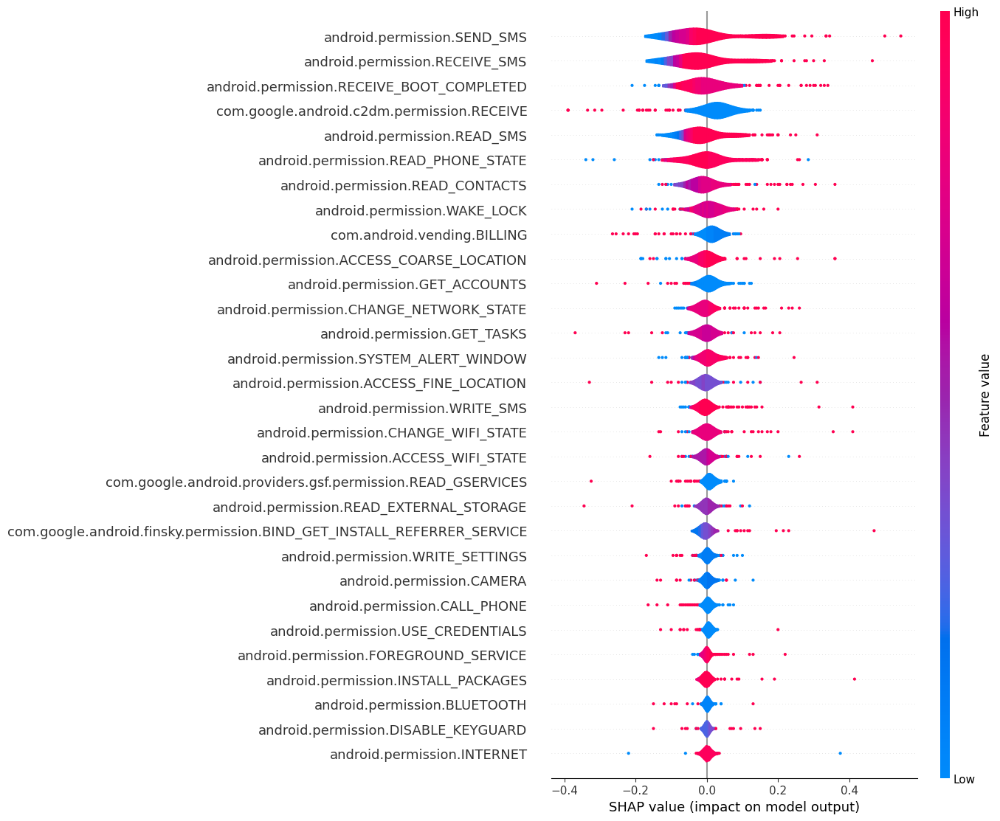

___________________________
Local Explaination


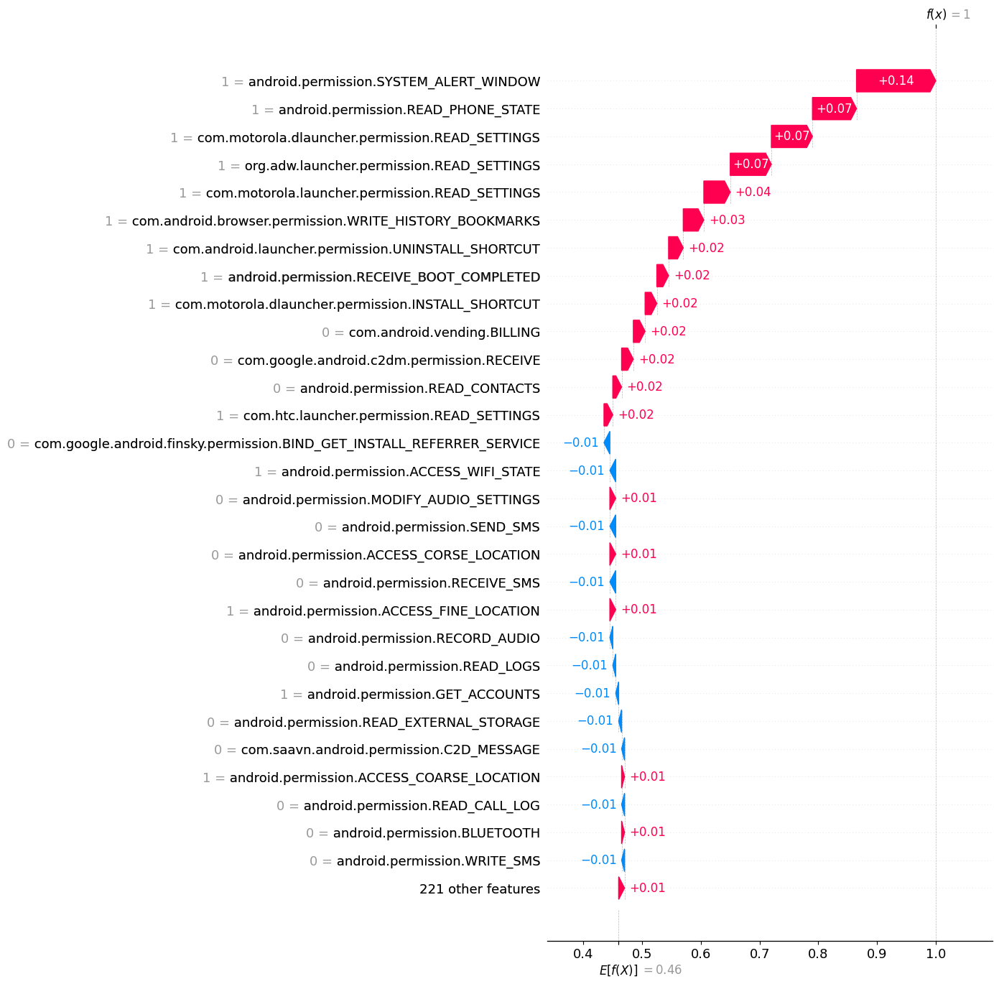

Local Explaination


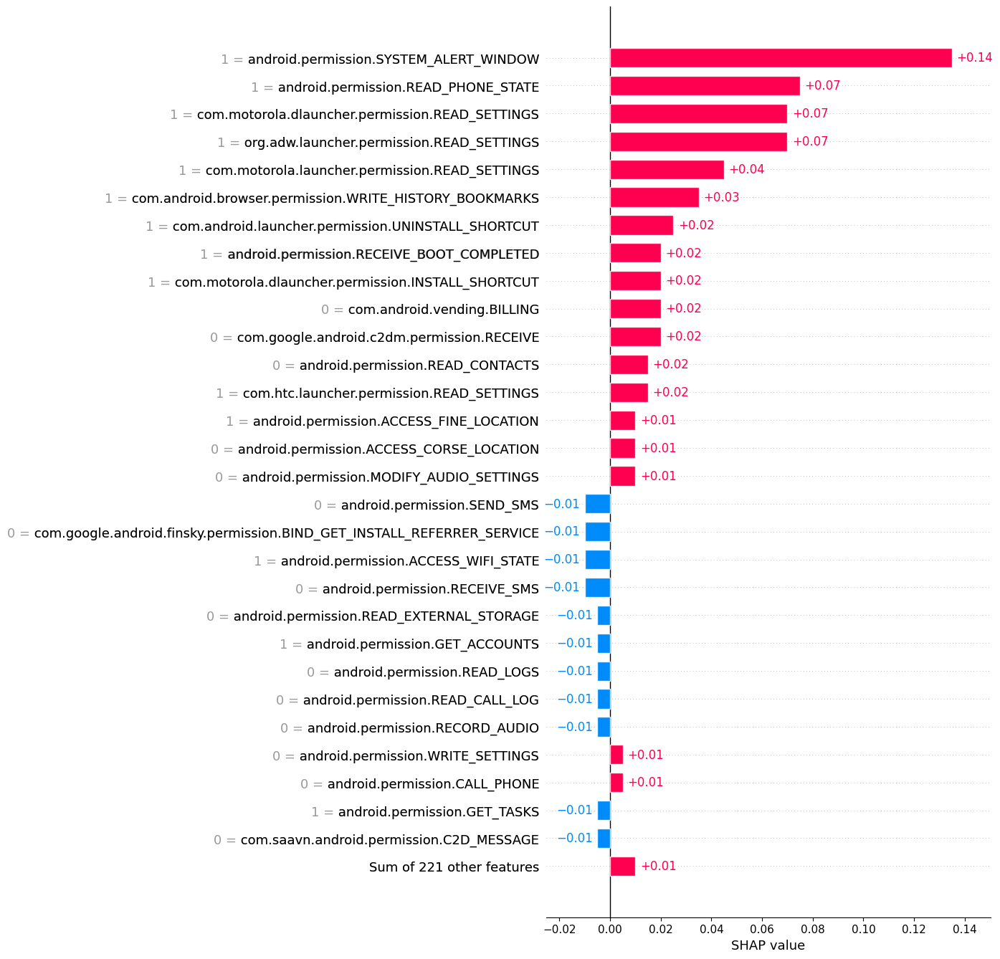

In [27]:
SHAP_EXP(rf_all)

Models:  GradientBoostingClassifier(max_depth=6, n_estimators=186, random_state=0)


PermutationExplainer explainer: 235it [00:21,  5.74it/s]                         


Global Explaination


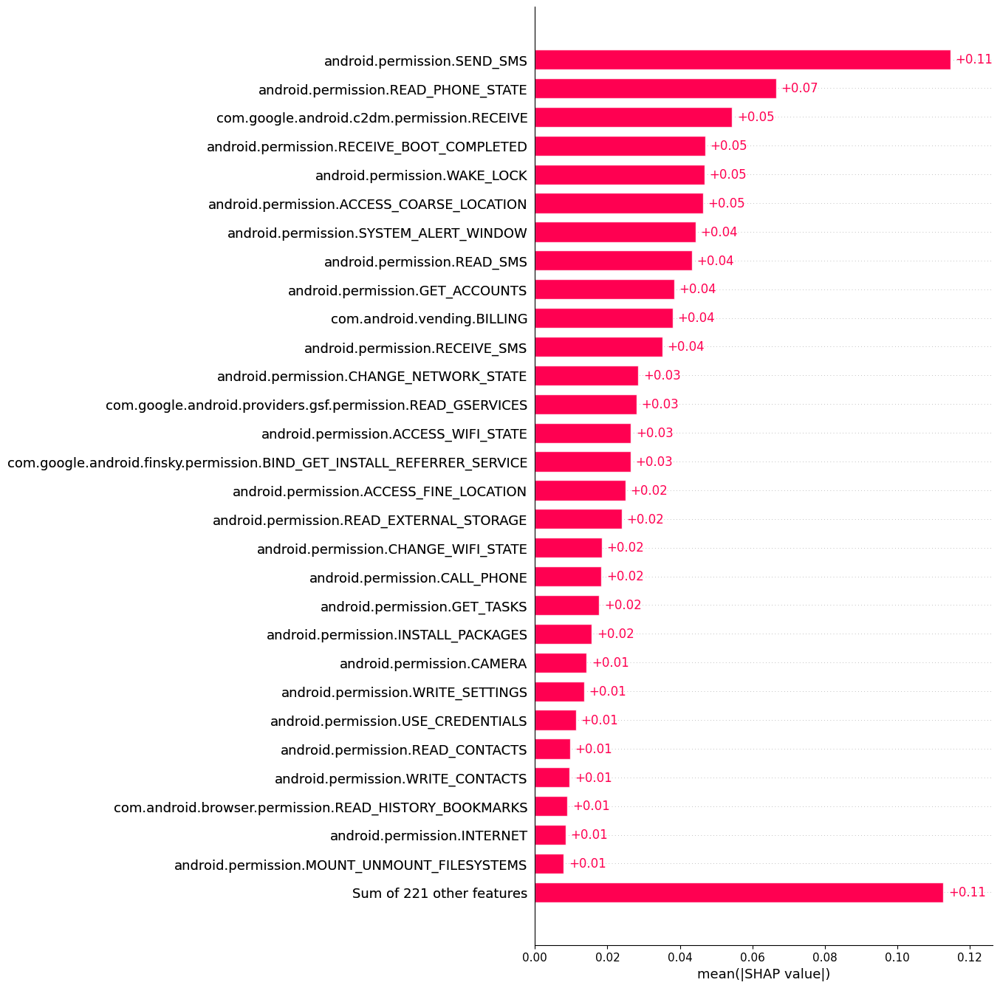

Global Explaination


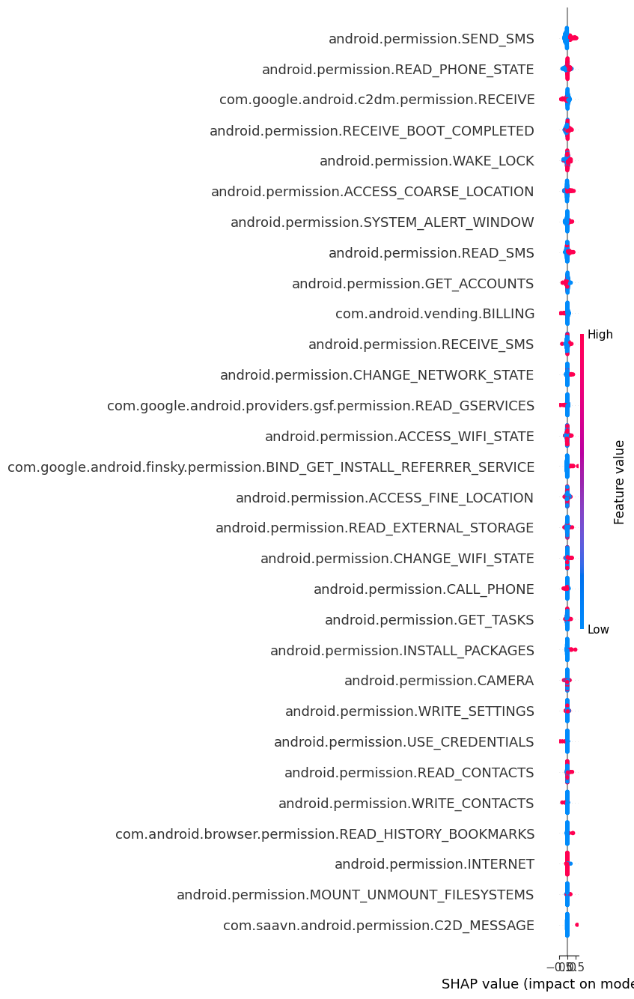

__________________________


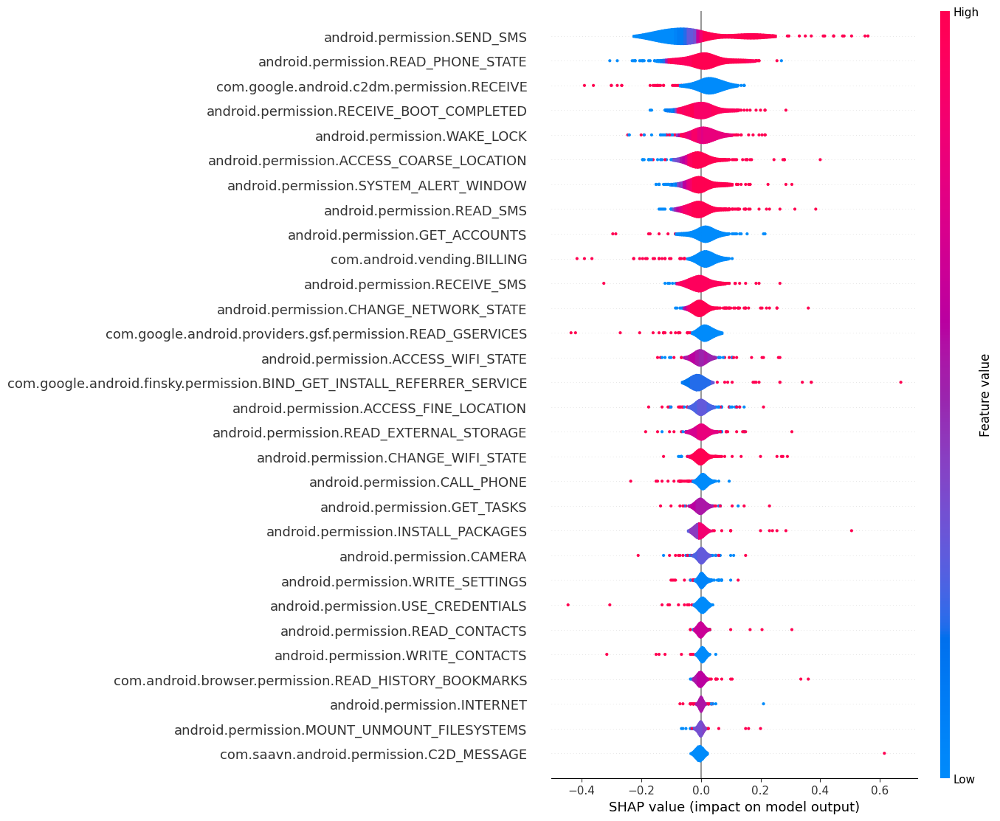

Local Explaination


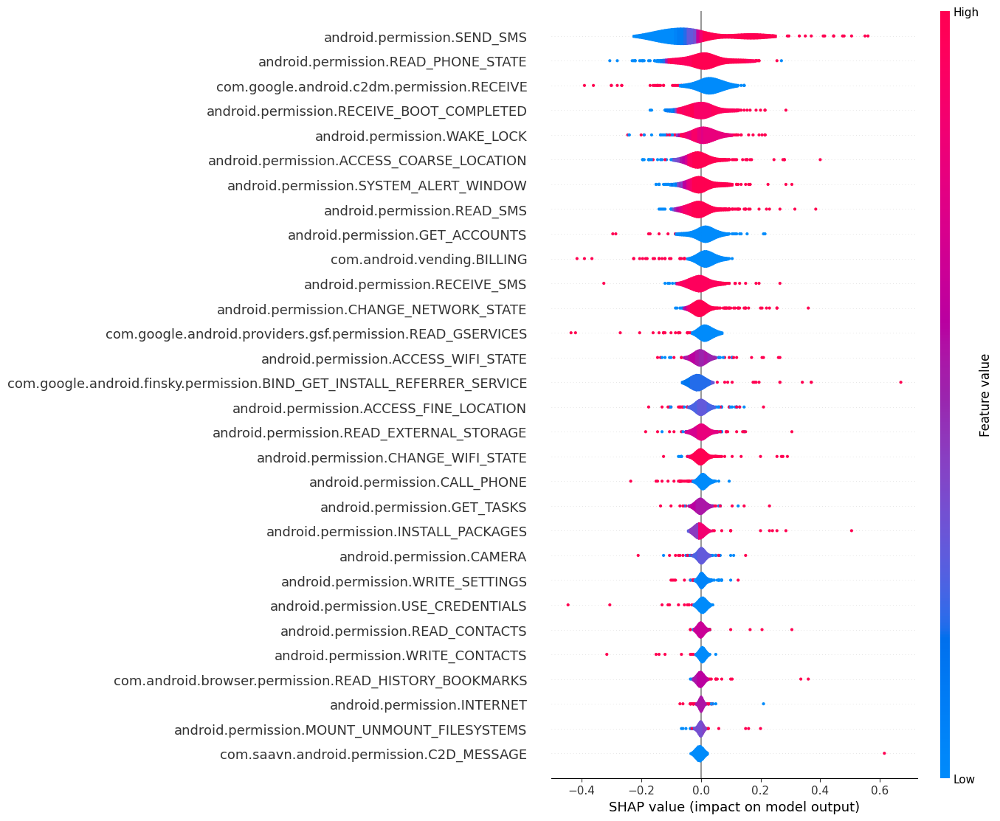

___________________________
Local Explaination


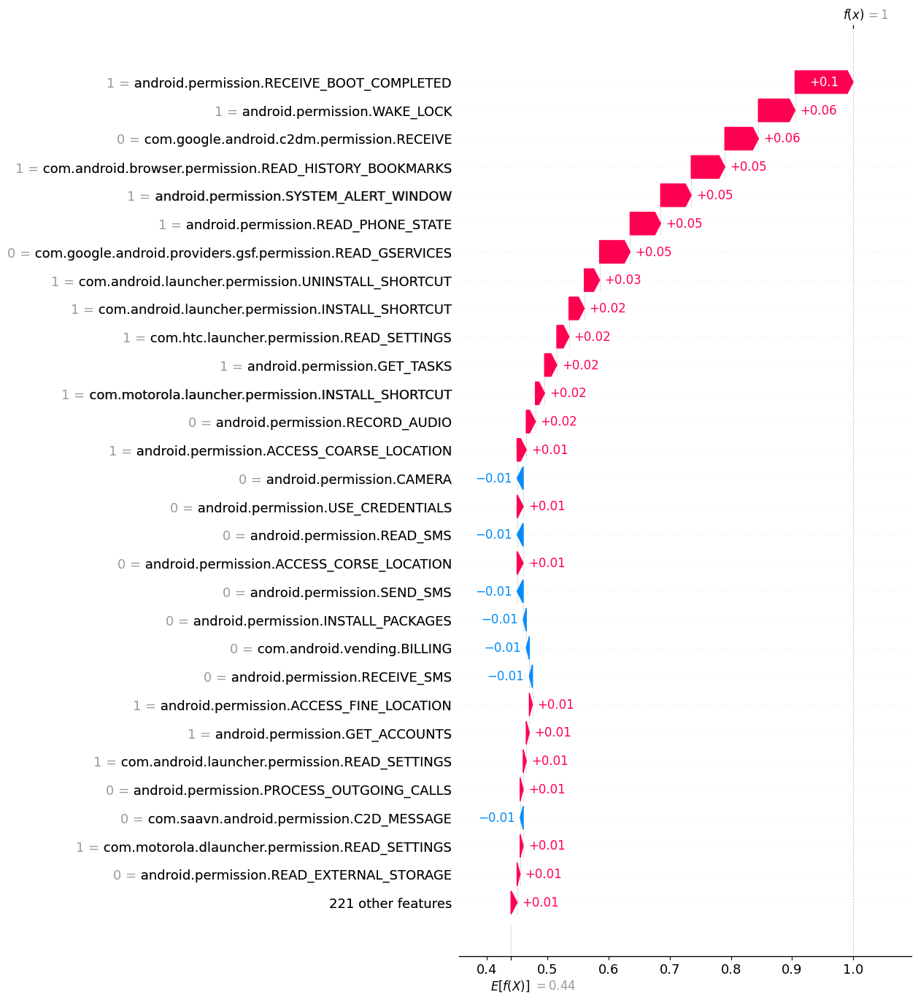

Local Explaination


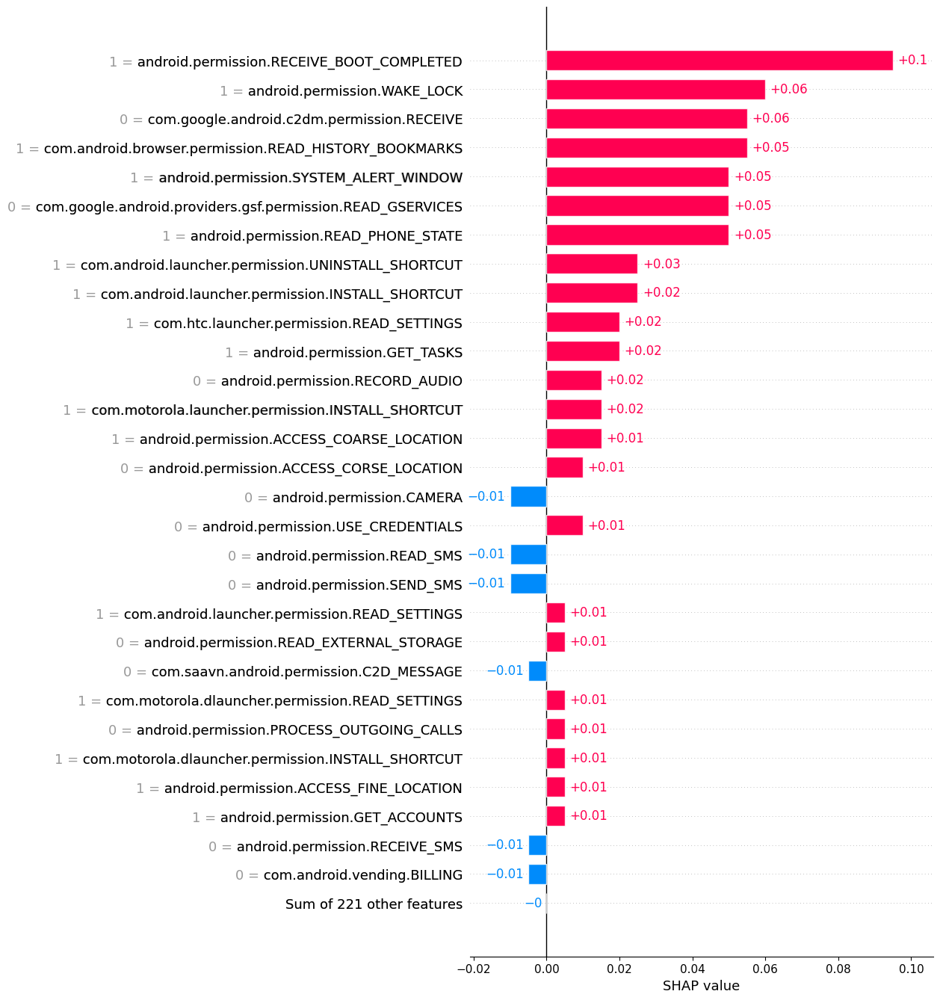

In [28]:
SHAP_EXP(gb_all)

Models:  XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=41, n_jobs=None,
              num_parallel_tree=None, random_state=0, ...)


PermutationExplainer explainer: 235it [00:50,  3.70it/s]                         


Global Explaination


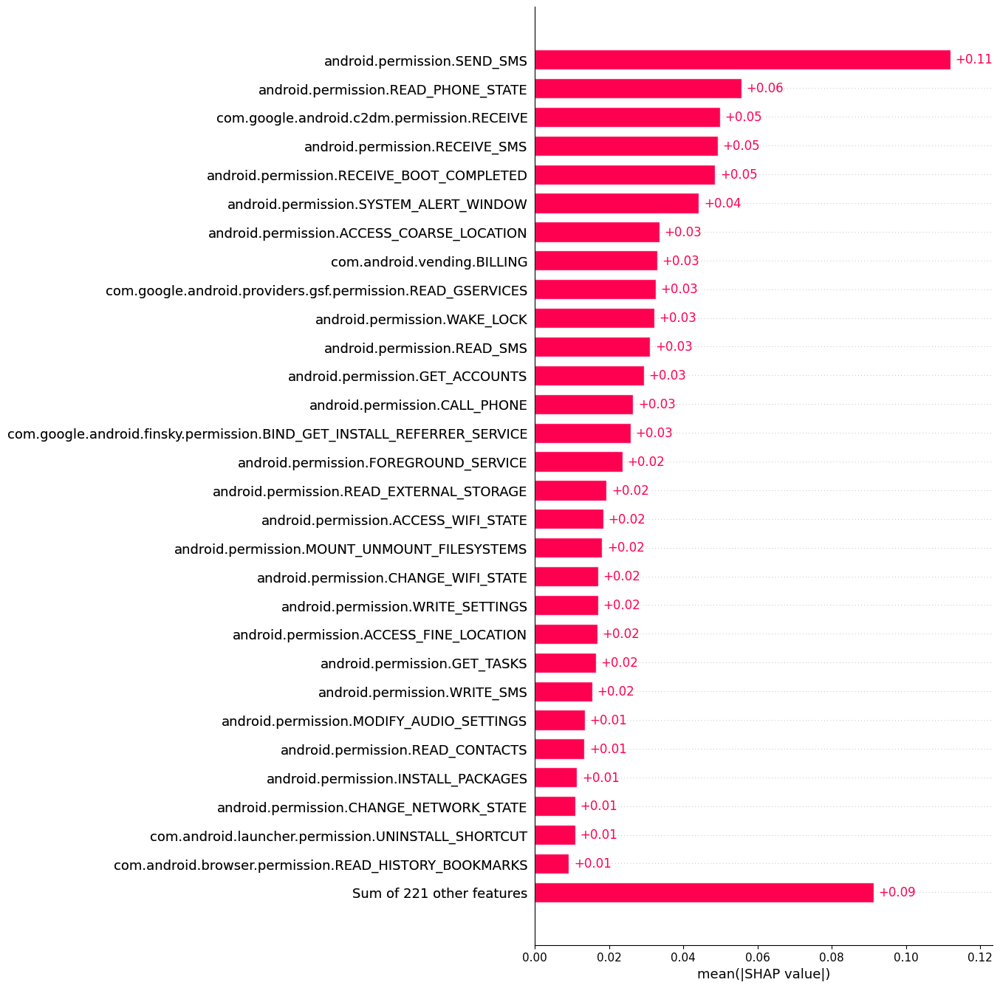

Global Explaination


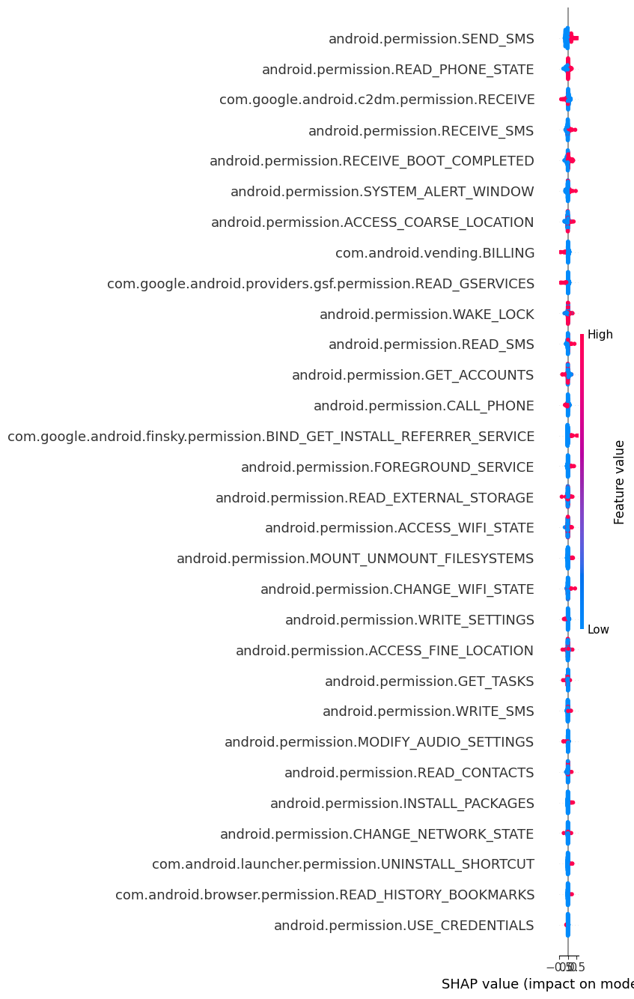

__________________________


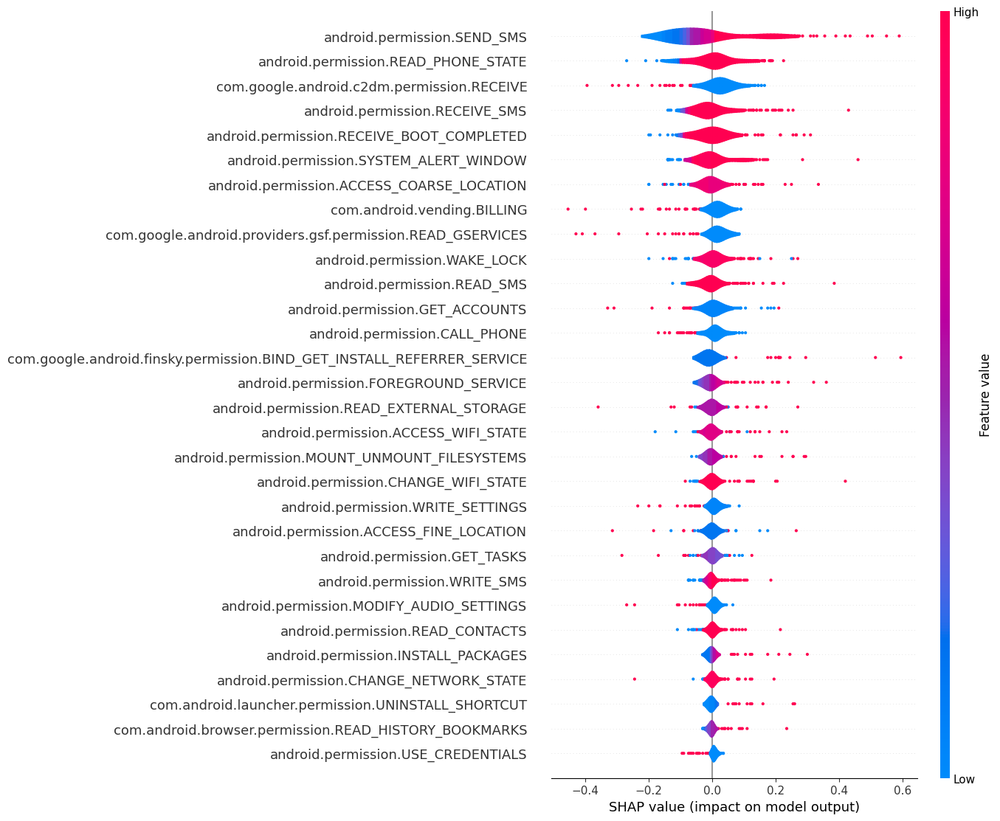

Local Explaination


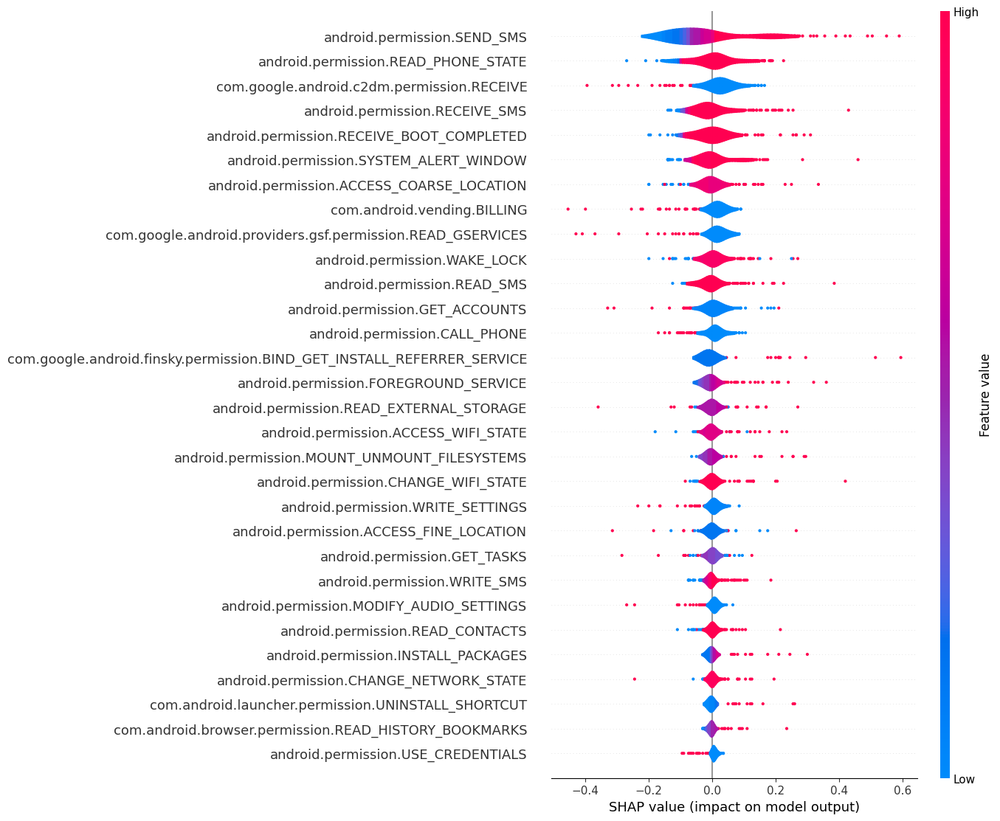

___________________________
Local Explaination


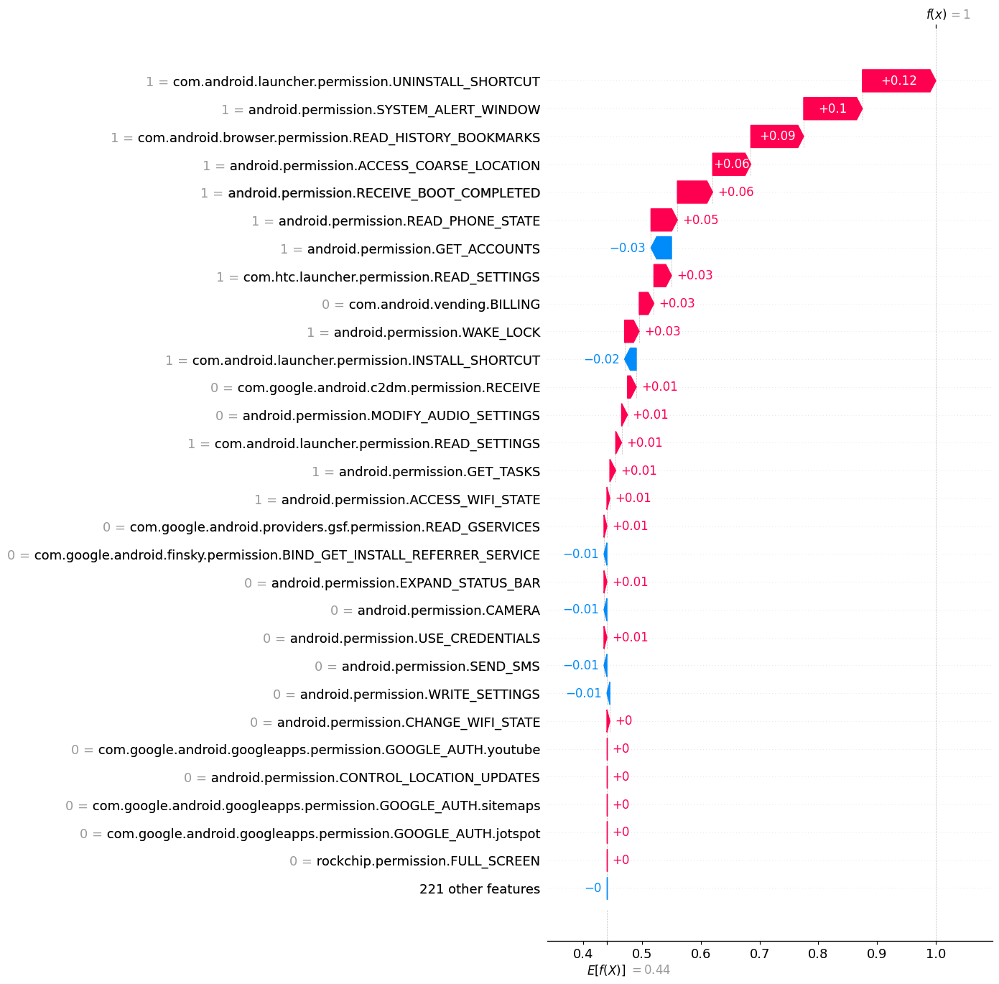

Local Explaination


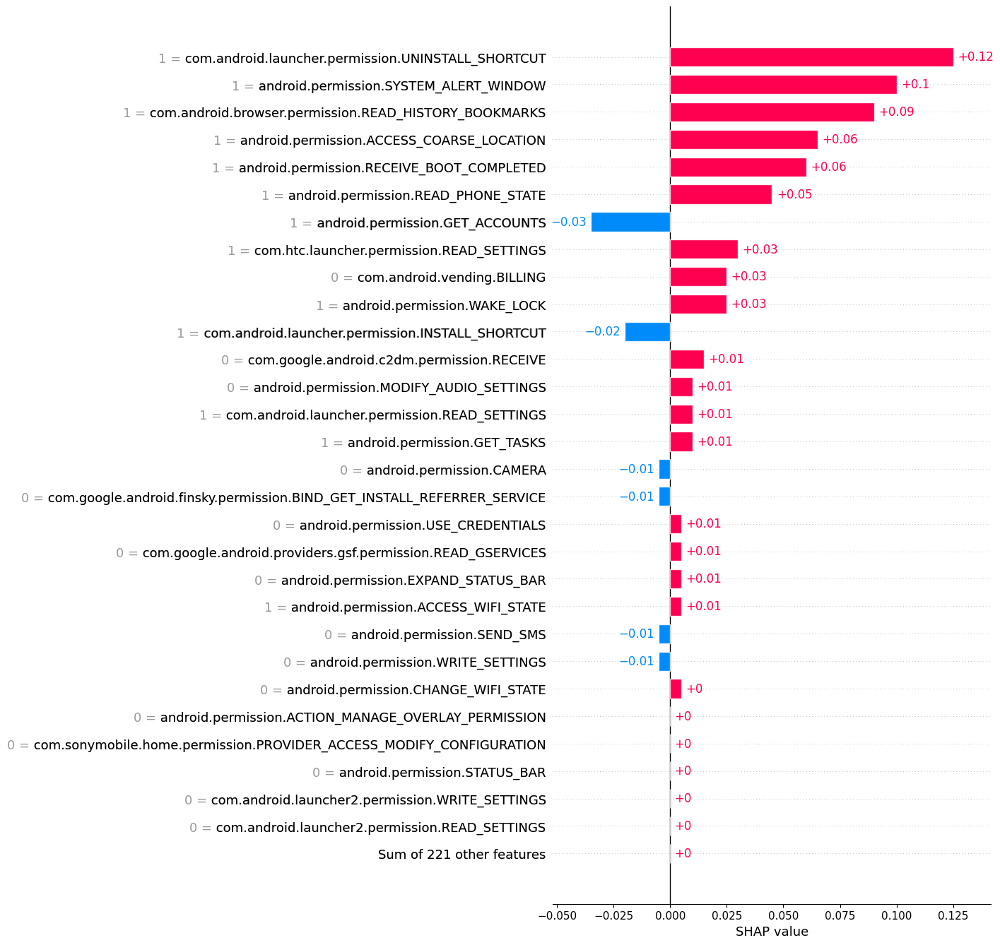

In [29]:
SHAP_EXP(xg_all)